In [11]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from skimage import exposure

In [12]:
# Clone the repository
try:
  !rm -r procesamiento_imagenes
  !git clone https://github.com/jchaves1406/procesamiento_imagenes
except FileExistsError:
  print("Repository already clone")

Cloning into 'procesamiento_imagenes'...
remote: Enumerating objects: 35, done.
remote: Counting objects: 100% (35/35), done.
remote: Compressing objects: 100% (32/32), done.
remote: Total 35 (delta 0), reused 0 (delta 0), pack-reused 0
Receiving objects: 100% (35/35), 36.72 MiB | 19.38 MiB/s, done.


## Transformada de Fourier para aplicar filtro Gaussiano:

In [13]:
def reducir_ruido_fourier(imagen, sigma=10):
    espectro = np.fft.fft2(imagen)
    espectro_desplazado = np.fft.fftshift(espectro)

    fila, columna = imagen.shape
    fila_centro, columna_centro = fila // 2, columna // 2
    y, x = np.ogrid[-fila_centro:fila - fila_centro, -columna_centro:columna - columna_centro]
    filtro = np.exp(-(x**2 + y**2) / (2 * sigma**2))

    espectro_filtrado = espectro_desplazado * filtro

    imagen_filtrada = np.abs(np.fft.ifft2(np.fft.ifftshift(espectro_filtrado))).astype(np.uint8)

    return imagen_filtrada

## Función de correción de Gamma:

In [14]:
def correccion_gamma(img,gamma):
    img=img / np.max(img)
    img=np.power(img, gamma)
    return  img * 255.0

## Se define la función que aplica el pipeline de procesamiento:

In [15]:
def pipeline(imagen):
    imagen_suavizada = reducir_ruido_fourier(imagen, sigma=200)
    imagen_t_lineal = cv2.convertScaleAbs(imagen_suavizada, alpha=1, beta=-80).astype(np.uint8)
    imagen_ecualizada = exposure.equalize_hist(imagen_t_lineal)
    imagen_gamma = correccion_gamma(imagen_ecualizada, 2)

    plt.figure(figsize=(22, 10))
    plt.subplot(151), plt.imshow(imagen, cmap='gray')
    plt.title('Imagen original'), plt.xticks([]), plt.yticks([])

    plt.subplot(152), plt.imshow(imagen_suavizada, cmap='gray')
    plt.title('Imagen filtro Gaussiano'), plt.xticks([]), plt.yticks([])

    plt.subplot(153), plt.imshow(imagen_t_lineal, cmap='gray')
    plt.title('Imagen transformacion lineal'), plt.xticks([]), plt.yticks([])

    plt.subplot(154), plt.imshow(imagen_ecualizada, cmap='gray')
    plt.title('Imagen ecualizada'), plt.xticks([]), plt.yticks([])

    plt.subplot(155), plt.imshow(imagen_gamma, cmap='gray')
    plt.title('Imagen filtro gamma'), plt.xticks([]), plt.yticks([])
    return imagen_gamma

## 1. Se aplica el pipeline para el primer lote de imagenes, fecha: 04/09/2023

### 1.1 __SDO/AIA 131:__

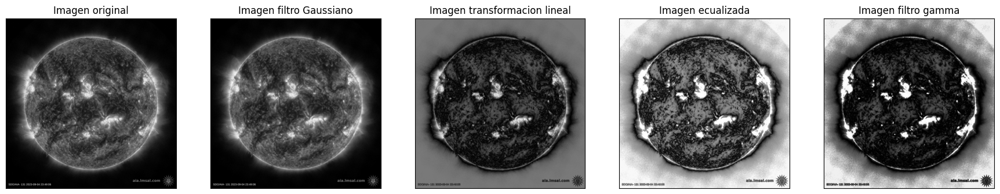

In [16]:
imagen = cv2.imread('/content/procesamiento_imagenes/sun_data/04092023/f0131.jpg', cv2.IMREAD_GRAYSCALE)
a = pipeline(imagen)

### 1.2 __SDO/AIA 171:__

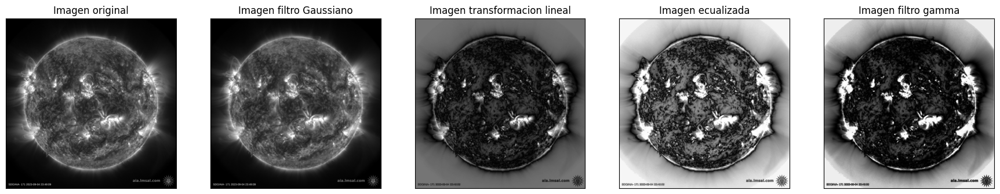

In [17]:
imagen = cv2.imread('/content/procesamiento_imagenes/sun_data/04092023/f0171.jpg', cv2.IMREAD_GRAYSCALE)
b = pipeline(imagen)

### 1.3 __SDO/AIA 304:__

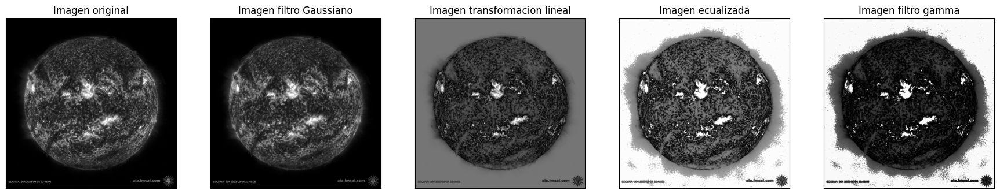

In [18]:
imagen = cv2.imread('/content/procesamiento_imagenes/sun_data/04092023/f0304.jpg', cv2.IMREAD_GRAYSCALE)
c = pipeline(imagen)

### 1.4 __SDO/AIA HM171:__

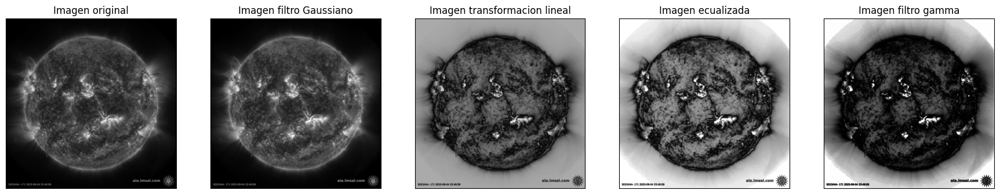

In [19]:
imagen = cv2.imread('/content/procesamiento_imagenes/sun_data/04092023/f_HMImag_171.jpg', cv2.IMREAD_GRAYSCALE)
d = pipeline(imagen)

### 1.5 Resultado final de cada pipeline aplicado a difrentes longitudes de onda:

(Text(0.5, 1.0, 'Resultado SDO/AIA HM171'), ([], []), ([], []))

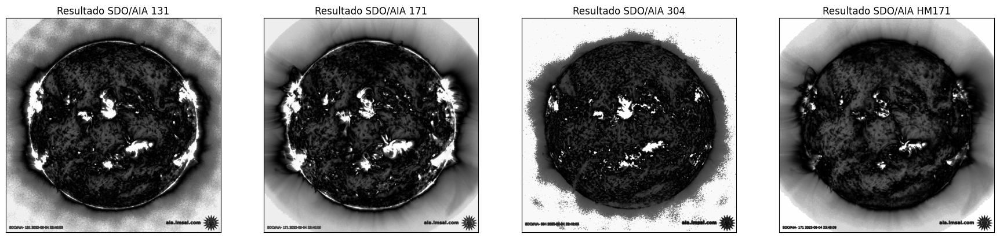

In [20]:
plt.figure(figsize=(22, 14))
plt.subplot(141), plt.imshow(a, cmap='gray')
plt.title('Resultado SDO/AIA 131'), plt.xticks([]), plt.yticks([])

plt.subplot(142), plt.imshow(b, cmap='gray')
plt.title('Resultado SDO/AIA 171'), plt.xticks([]), plt.yticks([])

plt.subplot(143), plt.imshow(c, cmap='gray')
plt.title('Resultado SDO/AIA 304'), plt.xticks([]), plt.yticks([])

plt.subplot(144), plt.imshow(d, cmap='gray')
plt.title('Resultado SDO/AIA HM171'), plt.xticks([]), plt.yticks([])

## 2. Se aplica el pipeline para el segundo lote de imagenes, fecha: 11/09/2023

### 2.1 __SDO/AIA 131:__

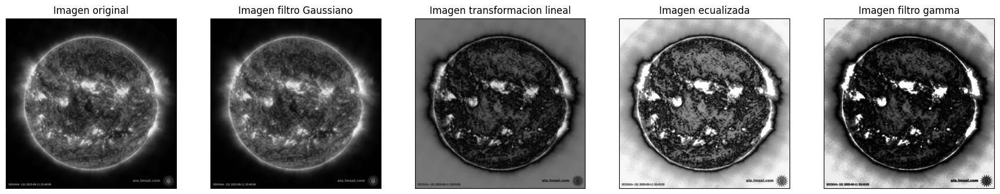

In [21]:
imagen = cv2.imread('/content/procesamiento_imagenes/sun_data/11092023/f0131.jpg', cv2.IMREAD_GRAYSCALE)
a = pipeline(imagen)

### 2.2 __SDO/AIA 171:__

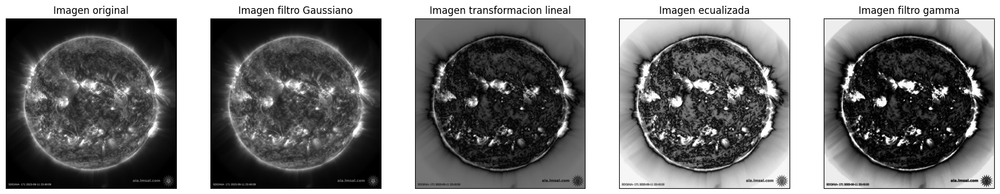

In [22]:
imagen = cv2.imread('/content/procesamiento_imagenes/sun_data/11092023/f0171.jpg', cv2.IMREAD_GRAYSCALE)
b = pipeline(imagen)

### 2.3 __SDO/AIA 304:__

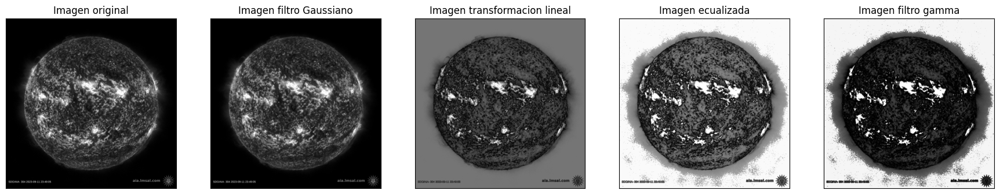

In [23]:
imagen = cv2.imread('/content/procesamiento_imagenes/sun_data/11092023/f0304.jpg', cv2.IMREAD_GRAYSCALE)
c = pipeline(imagen)

### 2.4 __SDO/AIA HM171:__

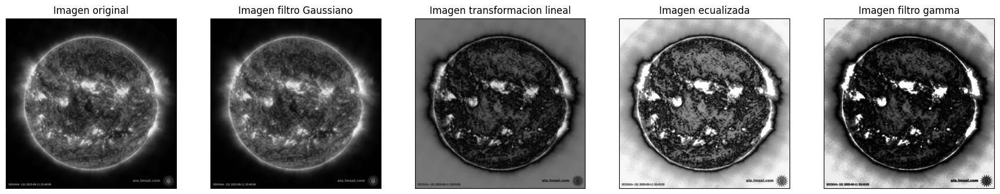

In [24]:
imagen = cv2.imread('/content/procesamiento_imagenes/sun_data/11092023/f0131.jpg', cv2.IMREAD_GRAYSCALE)
d = pipeline(imagen)

### 2.5 Resultado final de cada pipeline aplicado a difrentes longitudes de onda:

(Text(0.5, 1.0, 'Resultado SDO/AIA HM171'), ([], []), ([], []))

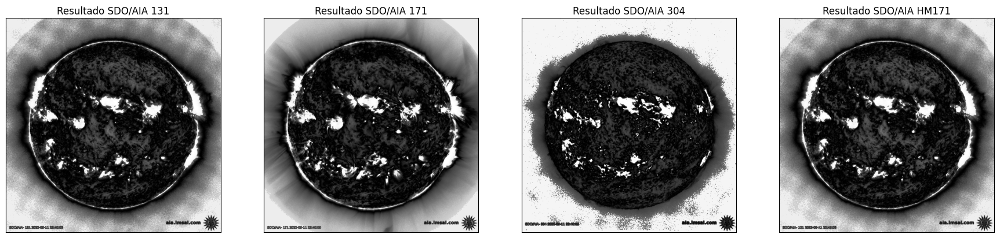

In [25]:
plt.figure(figsize=(22, 14))
plt.subplot(141), plt.imshow(a, cmap='gray')
plt.title('Resultado SDO/AIA 131'), plt.xticks([]), plt.yticks([])

plt.subplot(142), plt.imshow(b, cmap='gray')
plt.title('Resultado SDO/AIA 171'), plt.xticks([]), plt.yticks([])

plt.subplot(143), plt.imshow(c, cmap='gray')
plt.title('Resultado SDO/AIA 304'), plt.xticks([]), plt.yticks([])

plt.subplot(144), plt.imshow(d, cmap='gray')
plt.title('Resultado SDO/AIA HM171'), plt.xticks([]), plt.yticks([])

## 3. Se aplica el pipeline para el segundo lote de imagenes, fecha: 18/09/2023

### 3.1 __SDO/AIA 131:__

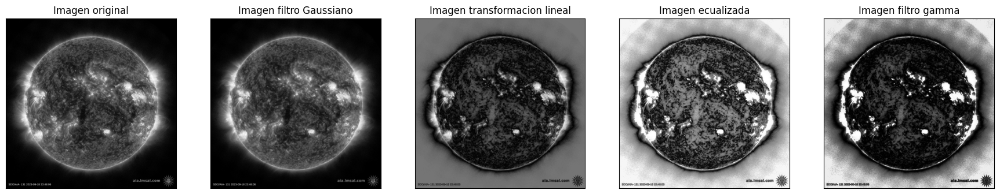

In [26]:
imagen = cv2.imread('/content/procesamiento_imagenes/sun_data/18092023/f0131.jpg', cv2.IMREAD_GRAYSCALE)
a = pipeline(imagen)

### 3.2 __SDO/AIA 171:__

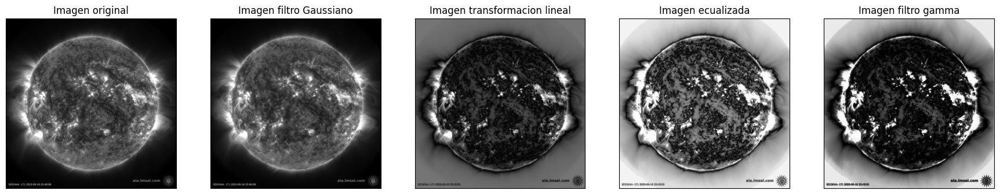

In [27]:
imagen = cv2.imread('/content/procesamiento_imagenes/sun_data/18092023/f0171.jpg', cv2.IMREAD_GRAYSCALE)
b = pipeline(imagen)

### 3.3 __SDO/AIA 304:__

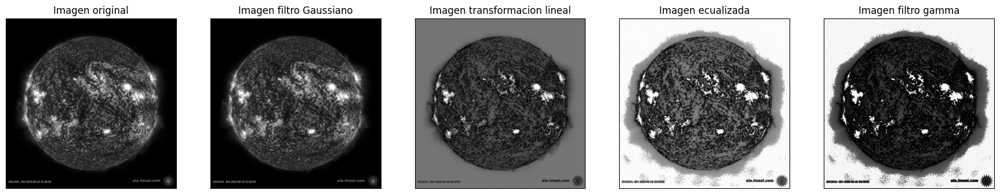

In [28]:
imagen = cv2.imread('/content/procesamiento_imagenes/sun_data/18092023/f0304.jpg', cv2.IMREAD_GRAYSCALE)
c = pipeline(imagen)

### 3.4 __SDO/AIA HM171:__

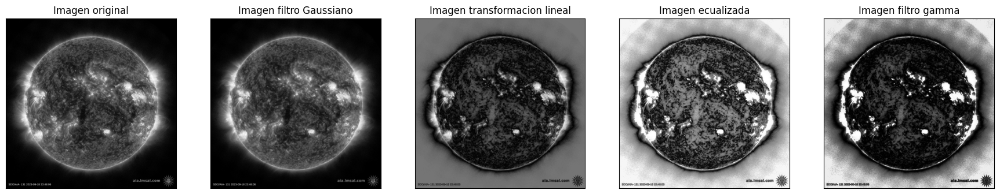

In [29]:
imagen = cv2.imread('/content/procesamiento_imagenes/sun_data/18092023/f0131.jpg', cv2.IMREAD_GRAYSCALE)
d = pipeline(imagen)

### 3.5 Resultado final de cada pipeline aplicado a difrentes longitudes de onda:

(Text(0.5, 1.0, 'Resultado SDO/AIA HM171'), ([], []), ([], []))

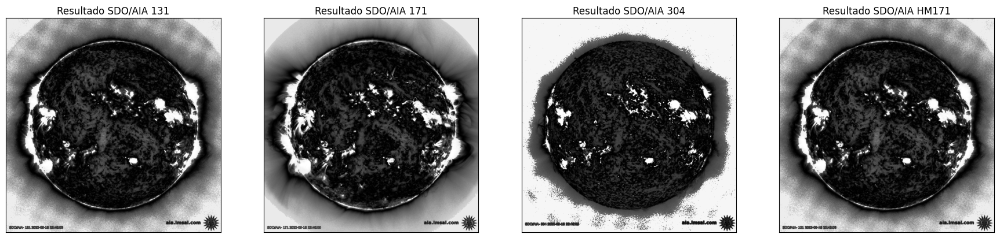

In [30]:
plt.figure(figsize=(22, 14))
plt.subplot(141), plt.imshow(a, cmap='gray')
plt.title('Resultado SDO/AIA 131'), plt.xticks([]), plt.yticks([])

plt.subplot(142), plt.imshow(b, cmap='gray')
plt.title('Resultado SDO/AIA 171'), plt.xticks([]), plt.yticks([])

plt.subplot(143), plt.imshow(c, cmap='gray')
plt.title('Resultado SDO/AIA 304'), plt.xticks([]), plt.yticks([])

plt.subplot(144), plt.imshow(d, cmap='gray')
plt.title('Resultado SDO/AIA HM171'), plt.xticks([]), plt.yticks([])

## 4. Se aplica el pipeline para el segundo lote de imagenes, fecha: 25/09/2023

### 4.1 __SDO/AIA 131:__

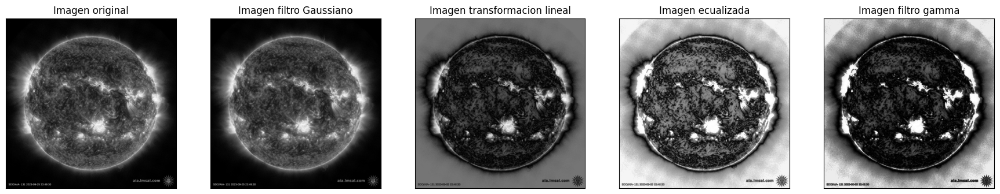

In [31]:
imagen = cv2.imread('/content/procesamiento_imagenes/sun_data/25092023/f0131.jpg', cv2.IMREAD_GRAYSCALE)
a = pipeline(imagen)

### 4.2 __SDO/AIA 171:__

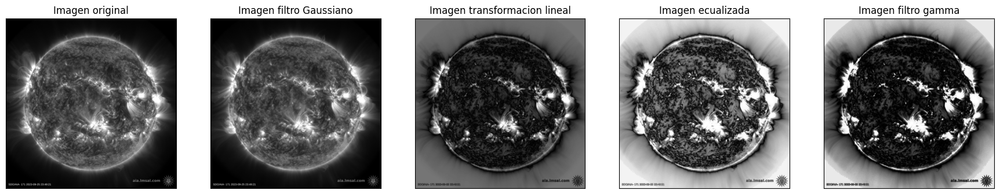

In [32]:
imagen = cv2.imread('/content/procesamiento_imagenes/sun_data/25092023/f0171.jpg', cv2.IMREAD_GRAYSCALE)
b = pipeline(imagen)

### 4.3 __SDO/AIA 304:__

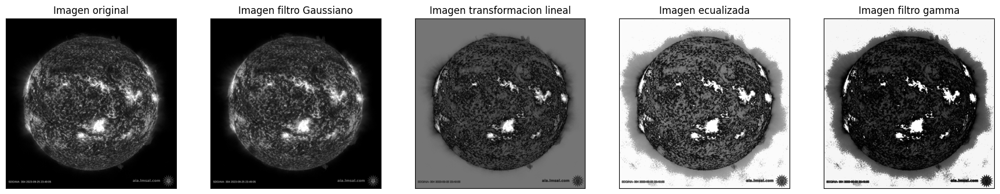

In [33]:
imagen = cv2.imread('/content/procesamiento_imagenes/sun_data/25092023/f0304.jpg', cv2.IMREAD_GRAYSCALE)
c = pipeline(imagen)

### 4.4 __SDO/AIA HM171:__

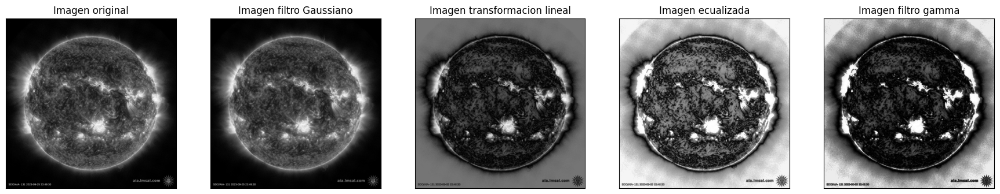

In [34]:
imagen = cv2.imread('/content/procesamiento_imagenes/sun_data/25092023/f0131.jpg', cv2.IMREAD_GRAYSCALE)
d = pipeline(imagen)

### 4.5 Resultado final de cada pipeline aplicado a difrentes longitudes de onda:

(Text(0.5, 1.0, 'Resultado SDO/AIA HM171'), ([], []), ([], []))

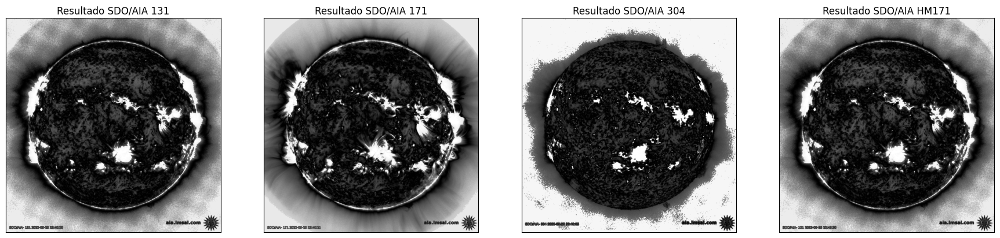

In [35]:
plt.figure(figsize=(22, 14))
plt.subplot(141), plt.imshow(a, cmap='gray')
plt.title('Resultado SDO/AIA 131'), plt.xticks([]), plt.yticks([])

plt.subplot(142), plt.imshow(b, cmap='gray')
plt.title('Resultado SDO/AIA 171'), plt.xticks([]), plt.yticks([])

plt.subplot(143), plt.imshow(c, cmap='gray')
plt.title('Resultado SDO/AIA 304'), plt.xticks([]), plt.yticks([])

plt.subplot(144), plt.imshow(d, cmap='gray')
plt.title('Resultado SDO/AIA HM171'), plt.xticks([]), plt.yticks([])